### Notebook for the manual annotation of cell states and excluding stromal

- **Developed by:** Carlos Talavera-López Ph.D
- **Würzburg Institute for Systems Immunology - Faculty of Medicine - Julius-Maximilian-Universität Würzburg**
- v231127

### Import required modules

In [1]:
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

from SCCAF import SCCAF_assessment, plot_roc

### Set up working environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'RdPu', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.2
scanpy      1.9.5
-----
PIL                 10.0.0
SCCAF               NA
asttokens           NA
backcall            0.2.0
colorama            0.4.6
comm                0.1.4
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.7.post1
decorator           5.1.1
exceptiongroup      1.1.3
executing           1.2.0
h5py                3.9.0
igraph              0.10.8
importlib_resources NA
ipykernel           6.25.1
ipywidgets          8.1.0
jedi                0.19.0
joblib              1.3.2
kiwisolver          1.4.5
llvmlite            0.40.1
louvain             0.8.1
matplotlib          3.7.2
mpl_toolkits        NA
natsort             8.4.0
numba               0.57.1
numexpr             2.8.7
numpy               1.24.4
packaging           23.1
pandas              2.1.1
parso               0.8.3
patsy               0.5.3
pexpect             4.8.0
pickleshare         0.7.5
pkg_resources       NA
platformdirs        

### Read in Healthy-CTRL dataset

In [3]:
adata = sc.read_h5ad('../data/heart_mm_nuclei-23-0092_scANVI-CellStates_ctl231127.raw.h5ad') 
adata

AnnData object with n_obs × n_vars = 46279 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

### Visualise manifold with `scANVI` annotation

/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:12

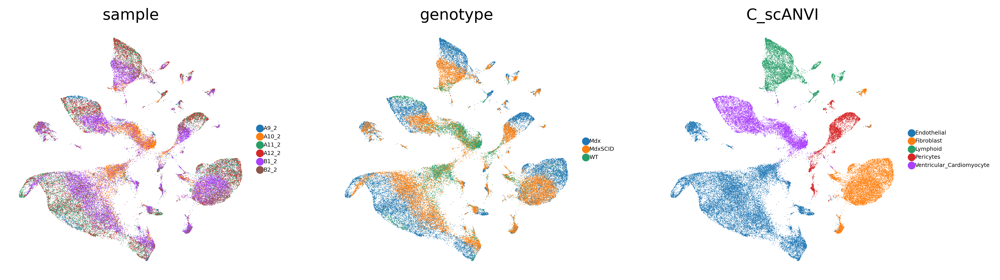

In [5]:
sc.pl.umap(adata, frameon = False, color = ['sample', 'genotype', 'C_scANVI'], size = 1, legend_fontsize = 5, ncols = 3)

### Cluster manifold using `leiden` with resolution of `1.0`

running Leiden clustering
    finished: found 18 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:09)


/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:12

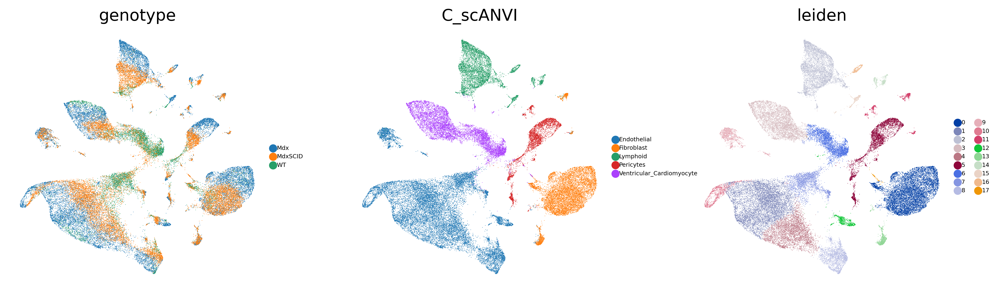

In [29]:
#sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.leiden(adata, resolution = 0.4, random_state = 1712)
sc.pl.umap(adata, frameon = False, color = ['genotype', 'C_scANVI', 'leiden'], size = 0.8, legend_fontsize = 5, ncols = 3)

### Evaluate clustering accuracy with `SCCAF`

/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:12

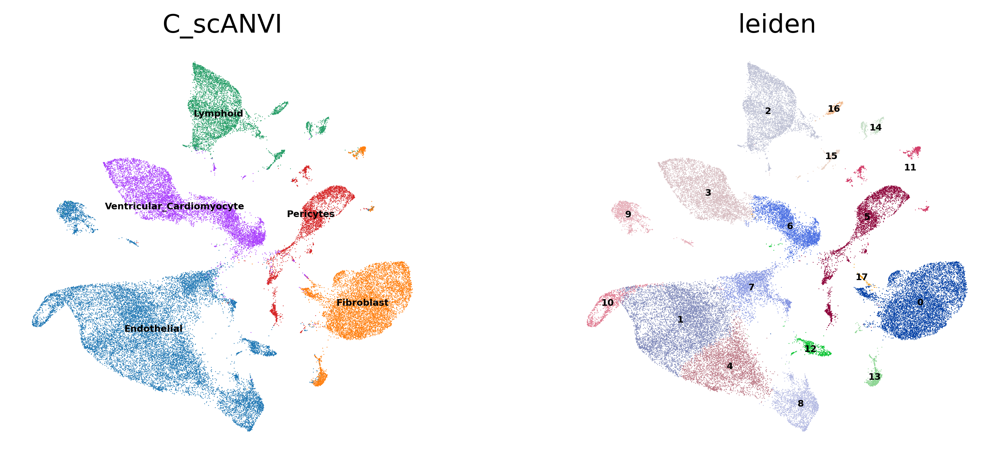

In [30]:
sc.pl.umap(adata, frameon = False, color = ['C_scANVI', 'leiden'], size = 0.8, legend_fontsize = 5, ncols = 3, legend_loc = 'on data')

In [31]:
y_prob, y_pred, y_test, clf, cvsm, acc = SCCAF_assessment(adata.X, adata.obs['leiden'], n = 100)

/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/SCCAF/__init__.py:249: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  c_idx = df.groupby('class').apply(lambda x: msample(x, n=n, frac=frac)).index.get_level_values(None)


/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/SCCAF/__init__.py:251: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return X[c_idx, :], X[d_idx, :], y[c_idx], y[d_idx]


Mean CV accuracy: 0.8857
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.8902


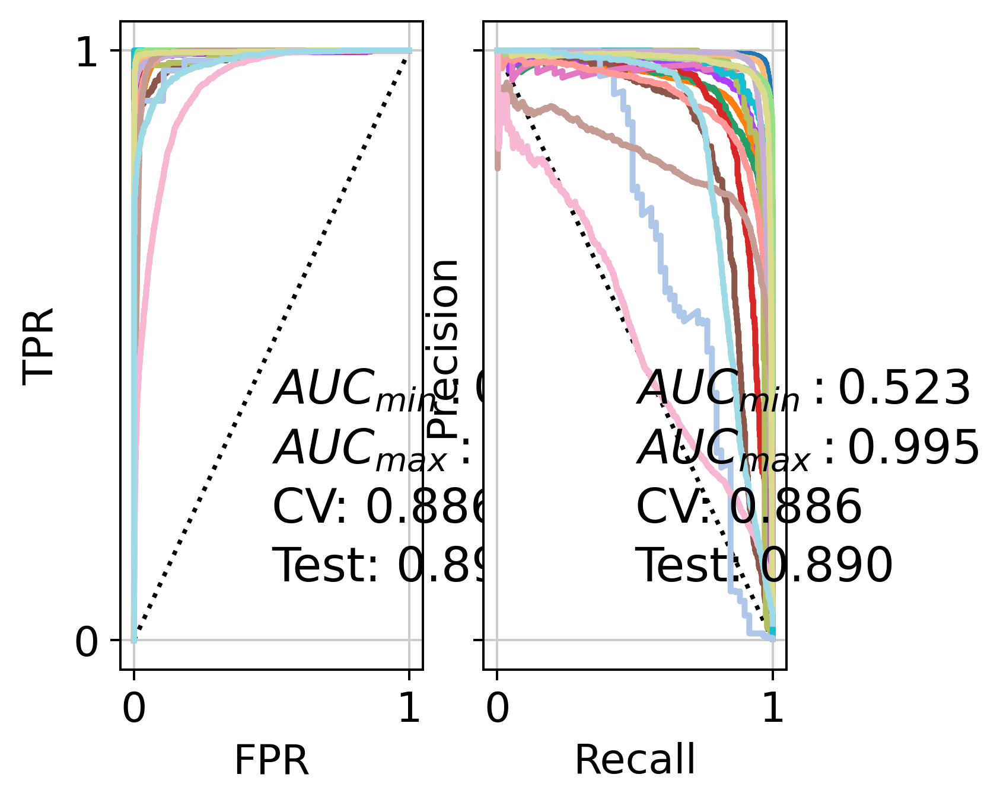

In [32]:
plot_roc(y_prob, y_test, clf, cvsm = cvsm, acc = acc)
plt.rcParams["figure.figsize"] = (16,6)
plt.show()

In [13]:
adata

AnnData object with n_obs × n_vars = 46279 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors', 'genotype_colors', 'C_scANVI_colors', 'neighbors', 'leiden', 'leiden_colors'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'
    obsp: 'distances', 'connectivities'

### Rename cluster based on the cell type annotation

/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:12

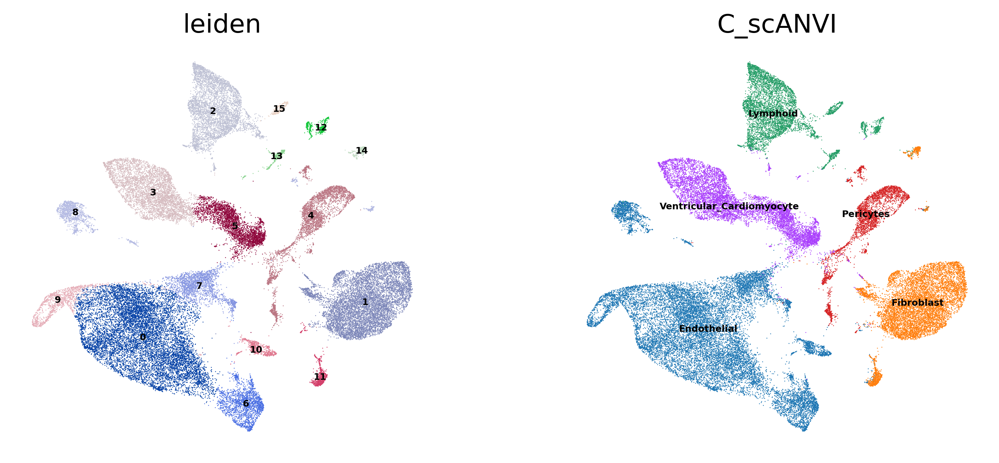

In [27]:
sc.pl.umap(adata, frameon = False, color = ['leiden', 'C_scANVI'], size = 1, legend_fontsize = 5, ncols = 3, legend_loc = 'on data')

In [33]:
adata.obs['leiden'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17'],
      dtype='object')

/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:12

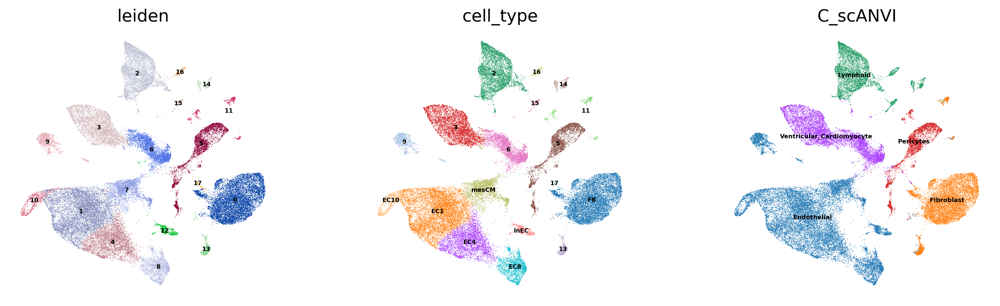

In [42]:
adata.obs['cell_type'] = adata.obs['leiden']
adata.obs['cell_type'] = adata.obs['cell_type'].cat.rename_categories(['FB', 'EC1', '2', '3', 'EC4', '5', '6', 'mesCM', 'EC8', 'Myeloid', 'EC10', '11', 'lnEC',
       'mesFB', '14', '15', '16', '17'])
sc.pl.umap(adata, frameon = False, color = ['leiden', 'cell_type', 'C_scANVI'], size = 1, legend_fontsize = 5, ncols = 3, legend_loc = 'on data')

### Calculate cluster-specific marker genes using _Wilcoxon's Rank Sum Test_

In [38]:
adata_log = adata.copy()
adata_log

AnnData object with n_obs × n_vars = 46279 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors', 'genotype_colors', 'C_scANVI_colors', 'neighbors', 'leiden', 'leiden_colors', 'cell_type_colors'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'
    obsp: 'distances', 'connectivities'

In [39]:
sc.pp.normalize_total(adata_log, target_sum = 1e6, exclude_highly_expressed = True)
sc.pp.log1p(adata_log)

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
[]
    finished (0:00:00)


In [40]:
sc.tl.rank_genes_groups(adata_log, 'cell_type', method = 'wilcoxon', n_genes = 100, use_raw = False)
result = adata_log.uns['rank_genes_groups']
groups = result['names'].dtype.names
wilcox_markers = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','logfoldchanges', 'pvals_adj']})
wilcox_markers.head(10)

ranking genes


/home/ruth/mambaforge/envs/scanpy/lib/python3.9/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:55)


,0_n,0_l,0_p,1_n,1_l,1_p,2_n,2_l,2_p,3_n,...,14_p,15_n,15_l,15_p,16_n,16_l,16_p,17_n,17_l,17_p
0,Pcdh9,9.751685,0.0,Cyyr1,7.016658,0.0,Slc9a9,8.560490,0.0,Gm31251,...,1.778123e-239,Bank1,10.017627,1.112406e-185,Ptprc,8.616100,2.158553e-138,Erbb4,7.295227,3.568721e-34
1,Abca8a,8.459160,0.0,Etl4,6.055427,0.0,Mrc1,9.261011,0.0,D830005e20rik,...,2.592878e-237,Aff3,9.340815,9.210767e-184,Myo1f,8.754639,4.797524e-131,Rbm20,6.976764,1.738535e-28
2,Bicc1,7.972123,0.0,Adgrl4,6.977588,0.0,Rbpj,7.157177,0.0,Erbb4,...,2.601791e-235,Ripor2,8.879925,6.945139e-176,Fgr,11.405356,2.004452e-130,Corin,6.676060,2.149939e-27
3,Tnxb,8.769026,0.0,Ccdc85a,7.604935,0.0,Dock2,8.894263,0.0,Mhrt,...,1.533105e-217,Arhgap15,8.410240,1.995517e-171,Arhgap15,8.165424,3.478874e-127,Esrrg,6.663592,7.367161e-27
4,Tenm3,9.476600,0.0,Pdgfd,6.406500,0.0,Ptprc,8.645908,0.0,Mlip,...,6.635904e-213,Prkcb,8.721528,5.586717e-163,Fyb,8.446256,4.995891e-126,Myocd,6.562951,7.485191e-27
5,Kcnt2,7.874466,0.0,Ablim3,7.424285,0.0,Runx1,8.786474,0.0,Tnni3k,...,7.466674e-208,Ighm,10.891809,3.497587e-159,Gm15987,11.273547,1.824602e-121,Pcdh9,6.750358,7.485191e-27
6,Arhgap24,7.807014,0.0,Flt1,6.659941,0.0,Fyb,9.011573,0.0,Rbm20,...,6.809511e-203,Pax5,14.405946,1.048177e-155,Cd44,8.092292,3.958081e-121,Gm31251,6.534043,2.144203e-26
7,Mir100hg,7.171004,0.0,Mgll,6.619446,0.0,Mctp1,7.829700,0.0,Myocd,...,8.247198e-187,Dock2,8.229901,5.048963e-155,Dock2,8.159275,5.897782e-120,D830005e20rik,6.598255,4.440819e-26
8,Htra3,8.839492,0.0,Plcb4,4.948713,0.0,Pid1,6.401368,0.0,Hs3st5,...,1.905649e-183,Ralgps2,8.849647,4.377219e-150,Gpr141,11.704762,5.359153e-115,Chrm2,6.479199,4.821402e-26
9,Gpc6,7.939584,0.0,Magi1,4.986403,0.0,Ptprj,6.934610,0.0,Chrm2,...,1.118181e-178,Btla,12.238615,2.959804e-146,Itga4,8.489586,6.155752e-114,Kcnn2,6.418128,6.783479e-26


In [41]:
wilcox_markers.to_csv('../data/heart_mm_nuclei-23-0092_scANVI-CellTypes_ctl231127_WilcoxRST_markers.csv', sep = ',', index = False)

### Export annotated object

In [ ]:
BrEpit_ALL

In [ ]:
sc.pl.umap(BrEpit_ALL, frameon = False, color = ['leiden_states', 'STEAP4', 'CEP55', 'FOXJ1', 'PIGR', 'SERPINE2', 'ADM2', 'WNT10A'], size = 1, legend_fontsize = 5, ncols = 4, legend_loc = 'on data')